# Feature Extractions

In [44]:

import numpy as np
import pandas as pd
from rdkit import Chem
from rdkit.Chem import rdMolDescriptors
from rdkit.Chem import AllChem
from rdkit.Chem import rdMolTransforms
from rdkit.Chem import Descriptors
import networkx as nx
from rdkit.Chem.GraphDescriptors import Chi0, Chi1, Chi2n, Chi3n



## Features for Ligand-Protein Interaction

Summary of Features:
1. Hydrogen Bonds: Number of donors and acceptors.
2. Hydrophobic Interactions: Identifying non-polar atoms.
3. Van der Waals Interactions: Energy calculation.
4. Pi-Pi Stacking: Aromatic ring detection.
5. Salt Bridges: Charged atoms interaction.
6. Metal Coordination: Interaction with metal ions.
7. Contact Distance: Distance between ligand and protein atoms.
8. Pocket Volume: Binding site volume.
9. Polar/Non-Polar Surface Area: Using TPSA to calculate polar surface.
10. Water-Mediated Interactions: Water interactions (requires docking/MD).
11. RMSD: Root mean square deviation between conformers.
12. Residue Interactions: Identifying protein residues interacting with the ligand.
13. Energy Contributions: Total interaction energy.
14. Pharmacophore Features: Hydrogen donors/acceptors, aromatic rings, etc.

### 1. Hydrogen Bonds
##### Hydrogen bonds are interactions where hydrogen donors from the ligand bond with acceptors in the protein. You can extract the number of hydrogen bond donors and acceptors for ligands.

In [2]:
def hydrogen_bond_features(mol):
    # Number of hydrogen bond acceptors (HBA) and donors (HBD)
    hba = rdMolDescriptors.CalcNumHBA(mol)
    hbd = rdMolDescriptors.CalcNumHBD(mol)
    return hba, hbd

### 2. Hydrophobic Interactions
#### Hydrophobic interactions occur when non-polar regions of the ligand interact with hydrophobic residues in the protein. This requires identifying non-polar atoms and their proximity to the protein.

In [3]:
def is_hydrophobic(atom):
    # Hydrophobic atoms are typically carbon and sulfur
    return atom.GetAtomicNum() in [6, 16]

def hydrophobic_interactions(mol):
    hydrophobic_atoms = [atom.GetIdx() for atom in mol.GetAtoms() if is_hydrophobic(atom)]
    return hydrophobic_atoms


### 3. Van der Waals (vdW) Interactions
#### Van der Waals interactions occur between all atoms that are close enough. Here, you can calculate Van der Waals energy using a force field.

In [5]:
def vdw_interaction_energy(mol):
    AllChem.UFFOptimizeMolecule(mol)
    ff = AllChem.UFFGetMoleculeForceField(mol)
    vdw_energy = ff.CalcEnergy()  # vdW energy is part of the total energy
    return vdw_energy


### 4. Pi-Pi Stacking Interactions
#### Pi-Pi stacking occurs between aromatic rings in the ligand and the protein. To detect these interactions, you first identify aromatic rings in the ligand.

In [6]:
def pi_pi_interactions(mol):
    aromatic_atoms = [atom.GetIdx() for atom in mol.GetAtoms() if atom.GetIsAromatic()]
    return aromatic_atoms


### 5. Salt Bridges
#### Salt bridges form between positively charged (basic) and negatively charged (acidic) residues. You can identify charged atoms in the ligand and analyze interactions with protein residues.

In [7]:
def charged_atoms(mol):
    # Identify charged atoms; common positive atoms: nitrogen (for basic groups)
    # and negative atoms: oxygen (for acidic groups)
    charged_atoms = [atom.GetIdx() for atom in mol.GetAtoms() if atom.GetFormalCharge() != 0]
    return charged_atoms


### 6. Metal Coordination
#### Some ligands coordinate with metal ions in the protein (like Zn, Mg, or Fe). Identifying metal-coordination sites can be done by recognizing ligand atoms close to metal ions.

In [8]:
def metal_coordination(mol):
    # Here you would look for atoms close to metal ions in the protein (usually detected via docking)
    metal_interacting_atoms = [atom.GetIdx() for atom in mol.GetAtoms() if atom.GetAtomicNum() in [7, 8, 16]]  # Example: N, O, S
    return metal_interacting_atoms


### 7. Contact Distance [TODO]
#### You can calculate the distance between ligand atoms and protein atoms (or other molecules) using RDKit.

In [10]:
def contact_distance(mol, atom1_idx, atom2_idx):
    # Calculate the 3D distance between two atoms in the molecule
    conf = mol.GetConformer()
    distance = rdMolTransforms.GetBondLength(conf, atom1_idx, atom2_idx)
    return distance


### 8. Pocket Volume [Explore PocketFinder]
#### You can use external tools like PocketFinder to calculate the volume of the binding pocket where the ligand is bound. RDKit can be used to identify atoms near the binding site.

In [11]:
def find_pocket_atoms(mol, binding_site_residues, cutoff=5.0):
    # Find ligand atoms within a certain distance from binding site residues
    pocket_atoms = []
    for atom in mol.GetAtoms():
        atom_pos = mol.GetConformer().GetAtomPosition(atom.GetIdx())
        for res in binding_site_residues:
            if atom_pos.Distance(res['coords']) <= cutoff:
                pocket_atoms.append(atom.GetIdx())
    return pocket_atoms


### 9. Polar and Non-Polar Surface Area
#### You can calculate the polar surface area (PSA) using RDKit, which is useful for identifying hydrophilic regions of the ligand.


In [12]:
def polar_surface_area(mol):
    return rdMolDescriptors.CalcTPSA(mol)

### 10. Water-Mediated Interactions
#### Water-mediated interactions usually require molecular dynamics (MD) or docking simulations to detect water molecules in the binding pocket. This can be done with GROMACS or AutoDock.

###### # Requires docking/simulation tools to calculate interactions via water molecules.
###### # Placeholder function:
###### def water_mediated_interactions():
######     pass

### 11. Root Mean Square Deviation (RMSD)
#### RMSD is used to compare different ligand conformations or ligand positions in a docking study. RDKit can calculate RMSD between two conformers of a molecule.

In [13]:
def calculate_rmsd(mol1, mol2):
    rmsd = AllChem.GetBestRMS(mol1, mol2)
    return rmsd

### 12. Residue Interactions [Try using PyMOL]
#### Identifying specific protein residues that interact with the ligand involves analyzing the proximity between ligand atoms and residues. PyMOL or similar molecular visualization tools can be used here, but RDKit can detect atomic distances.


In [14]:
def interacting_residues(mol, protein, cutoff=5.0):
    # Find protein residues that are within the cutoff distance from ligand atoms
    interacting_residues = []
    for atom in mol.GetAtoms():
        atom_pos = mol.GetConformer().GetAtomPosition(atom.GetIdx())
        for res in protein['residues']:
            if atom_pos.Distance(res['coords']) <= cutoff:
                interacting_residues.append(res['resid'])
    return interacting_residues

### 13. Energy Contributions (vdW, Electrostatic, etc.)
#### You can use force fields to estimate total interaction energy between ligand and protein, including van der Waals, electrostatic, and bond energies.

In [15]:
def interaction_energy(mol):
    AllChem.UFFOptimizeMolecule(mol)
    ff = AllChem.UFFGetMoleculeForceField(mol)
    total_energy = ff.CalcEnergy()
    return total_energy


### 14. Pharmacophore Features
#### Pharmacophore features include hydrogen bond donors/acceptors, aromatic rings, hydrophobic regions, etc.

In [17]:
def pharmacophore_features(mol):
    h_donors = Descriptors.NumHDonors(mol)
    h_acceptors = Descriptors.NumHAcceptors(mol)
    aromatic_rings = len([atom for atom in mol.GetAtoms() if atom.GetIsAromatic()])
    return h_donors, h_acceptors, aromatic_rings

## Graph based features

### 1. Molecular Graph Representation
#### Each molecule is treated as an undirected graph, where:

- Nodes represent atoms.
- Edges represent bonds between atoms.

You can load the SDF file and convert each molecule into a graph.

[09:00:19] Warning: molecule is tagged as 2D, but at least one Z coordinate is not zero. Marking the mol as 3D.
[09:00:19] Warning: molecule is tagged as 2D, but at least one Z coordinate is not zero. Marking the mol as 3D.
[09:00:19] Warning: molecule is tagged as 2D, but at least one Z coordinate is not zero. Marking the mol as 3D.
[09:00:19] Warning: molecule is tagged as 2D, but at least one Z coordinate is not zero. Marking the mol as 3D.
[09:00:19] Warning: molecule is tagged as 2D, but at least one Z coordinate is not zero. Marking the mol as 3D.
[09:00:19] Warning: molecule is tagged as 2D, but at least one Z coordinate is not zero. Marking the mol as 3D.
[09:00:19] Warning: molecule is tagged as 2D, but at least one Z coordinate is not zero. Marking the mol as 3D.
[09:00:19] Warning: molecule is tagged as 2D, but at least one Z coordinate is not zero. Marking the mol as 3D.
[09:00:19] Warning: molecule is tagged as 2D, but at least one Z coordinate is not zero. Marking the mol

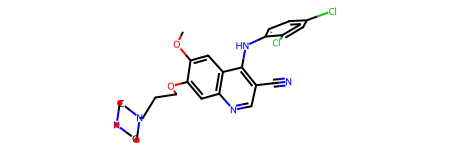

In [20]:
file_path = '/Users/charithrachandrashekar/Desktop/Everything Charithra/PESIT - DSML/Datasets.nosync/BindingDB_BindingDB_Articles_3D.sdf'

# Load molecules from an SDF file
def load_sdf(file_path):
    supplier = Chem.SDMolSupplier(file_path)
    molecules = [mol for mol in supplier if mol is not None]  # Ignore invalid molecules
    return molecules

molecules = load_sdf(file_path)

molecules[0]

### 2. Atom Degree
#### The degree of an atom is the number of bonds it forms. This can be extracted using RDKit for each atom in the molecule.


In [21]:
def atom_degrees(mol):
    return [atom.GetDegree() for atom in mol.GetAtoms()]

### 3. Clustering Coefficient
#### In molecular graphs, the clustering coefficient measures how atoms are connected to each other in a localized neighborhood.


In [22]:
def calculate_clustering_coefficient(mol):
    clustering = []
    for atom in mol.GetAtoms():
        neighbors = [neighbor.GetIdx() for neighbor in atom.GetNeighbors()]
        if len(neighbors) < 2:
            clustering.append(0.0)
            continue
        num_edges = 0
        for i in range(len(neighbors)):
            for j in range(i+1, len(neighbors)):
                if mol.GetBondBetweenAtoms(neighbors[i], neighbors[j]):
                    num_edges += 1
        max_edges = len(neighbors) * (len(neighbors) - 1) / 2
        clustering.append(num_edges / max_edges if max_edges > 0 else 0.0)
    return clustering

### 4. Betweenness Centrality
#### Betweenness centrality is a measure of how often an atom lies on the shortest paths between other atoms in the molecule. You can use NetworkX for this calculation.

In [26]:
def create_graph_from_mol(mol):
    G = nx.Graph()
    for atom in mol.GetAtoms():
        G.add_node(atom.GetIdx())
    for bond in mol.GetBonds():
        G.add_edge(bond.GetBeginAtomIdx(), bond.GetEndAtomIdx())
    return G

def calculate_betweenness_centrality(mol):
    G = create_graph_from_mol(mol)
    return nx.betweenness_centrality(G)

betweenness_centrality = [calculate_betweenness_centrality(mol) for mol in molecules]
betweenness_centrality[0]

{0: 0.23674242424242425,
 1: 0.28882575757575757,
 2: 0.47253787878787873,
 3: 0.24621212121212122,
 4: 0.44034090909090917,
 5: 0.27178030303030304,
 6: 0.49242424242424243,
 7: 0.043560606060606064,
 8: 0.14962121212121215,
 9: 0.0606060606060606,
 10: 0.06060606060606061,
 11: 0.0,
 12: 0.4356060606060606,
 13: 0.06060606060606061,
 14: 0.3787878787878788,
 15: 0.35132575757575757,
 16: 0.06060606060606061,
 17: 0.16382575757575757,
 18: 0.10416666666666667,
 19: 0.05587121212121212,
 20: 0.06534090909090909,
 21: 0.0,
 22: 0.0,
 23: 0.0,
 24: 0.4090909090909091,
 25: 0.3787878787878788,
 26: 0.3446969696969697,
 27: 0.10700757575757576,
 28: 0.05776515151515152,
 29: 0.05776515151515152,
 30: 0.10700757575757576,
 31: 0.3106060606060606,
 32: 0.06439393939393939,
 33: 0.0}

### 5. Eigenvector Centrality
#### Eigenvector centrality identifies the most influential atoms in the graph based on their connectivity.

In [ ]:
def calculate_eigenvector_centrality(mol):
    G = create_graph_from_mol(mol)
    return nx.eigenvector_centrality_numpy(G)

eigenvector_centrality = [calculate_eigenvector_centrality(mol) for mol in molecules]

In [ ]:
eigenvector_centrality[0]

### 6. Graph Diameter
#### The diameter of a molecular graph is the longest shortest path between any two atoms.

In [29]:
def calculate_graph_diameter(mol):
    G = create_graph_from_mol(mol)
    return nx.diameter(G) if nx.is_connected(G) else -1  # If graph is disconnected, return -1

graph_diameters = [calculate_graph_diameter(mol) for mol in molecules]

graph_diameters[0]

19

In [31]:
print(graph_diameters[:20])

[19, 20, 15, 15, 16, 15, 15, 16, 17, 17, 18, 18, 19, 20, 18, 18, 18, 18, 18, 19]


### 7. Graph Radius
#### The radius of a molecular graph is the minimum eccentricity (i.e., the shortest distance from one atom to the farthest atom).

In [32]:
def calculate_graph_radius(mol):
    G = create_graph_from_mol(mol)
    return nx.radius(G) if nx.is_connected(G) else -1

graph_radii = [calculate_graph_radius(mol) for mol in molecules]

print(graph_radii[:20])

[10, 10, 8, 8, 8, 8, 8, 8, 9, 9, 9, 9, 10, 10, 9, 9, 9, 9, 9, 10]


### 8. Molecular Connectivity Index (Chi)
#### The molecular connectivity index measures the degree of branching in the molecular graph. The more branching, the lower the connectivity index.

In [34]:

def molecular_connectivity_indices(mol):
    return {
        'Chi0': Chi0(mol),
        'Chi1': Chi1(mol),
        'Chi2n': Chi2n(mol),
        'Chi3n': Chi3n(mol)
    }

connectivity_indices = [molecular_connectivity_indices(mol) for mol in molecules]

In [36]:
connectivity_indices[:20]

[{'Chi0': 24.078775022443736,
  'Chi1': 16.4778968458859,
  'Chi2n': 8.27499382660878,
  'Chi3n': 5.936765105798988},
 {'Chi0': 27.070338854006454,
  'Chi1': 18.50259485579121,
  'Chi2n': 9.064840660819137,
  'Chi3n': 6.680029140743741},
 {'Chi0': 23.794317972067564,
  'Chi1': 16.01510031054725,
  'Chi2n': 6.7488920742551,
  'Chi3n': 4.645105593796672},
 {'Chi0': 22.216967702877938,
  'Chi1': 15.066411905563507,
  'Chi2n': 6.406459851182915,
  'Chi3n': 4.334754939840666},
 {'Chi0': 25.208531534440656,
  'Chi1': 17.09110991546882,
  'Chi2n': 7.196306685393273,
  'Chi3n': 5.078018974785418},
 {'Chi0': 21.672997628507925,
  'Chi1': 14.515100310547252,
  'Chi2n': 6.111755227130949,
  'Chi3n': 4.319997128447128},
 {'Chi0': 20.0956473593183,
  'Chi1': 13.566411905563507,
  'Chi2n': 5.769323004058764,
  'Chi3n': 4.009646474491122},
 {'Chi0': 23.087211190881018,
  'Chi1': 15.591109915468822,
  'Chi2n': 6.5591698382691215,
  'Chi3n': 4.752910509435875},
 {'Chi0': 24.241911729260266,
  'Chi1': 1

### 9. Topological Polar Surface Area (TPSA)
#### TPSA is calculated based on graph theory and measures the surface area of polar atoms (usually oxygen and nitrogen) in a molecule.


In [37]:
def calculate_tpsa(mol):
    return rdMolDescriptors.CalcTPSA(mol)

tpsa_values = [calculate_tpsa(mol) for mol in molecules]

tpsa_values[:20]

[73.64999999999999,
 101.34,
 94.86000000000001,
 85.63000000000001,
 113.32000000000002,
 85.63000000000001,
 76.4,
 104.09000000000002,
 79.64,
 70.41,
 98.10000000000001,
 79.64,
 79.64,
 55.190000000000005,
 64.42,
 64.42,
 77.55999999999999,
 77.55999999999999,
 77.30999999999999,
 77.30999999999999]

### 10. Wiener Index
#### The Wiener index is the sum of the shortest paths between all pairs of atoms in the molecular graph.


In [38]:
def calculate_wiener_index(mol):
    G = create_graph_from_mol(mol)
    return nx.wiener_index(G) if nx.is_connected(G) else -1

wiener_indices = [calculate_wiener_index(mol) for mol in molecules]

print(wiener_indices[:5])

[3875.0, 5198.0, 3230.0, 2742.0, 3806.0]


### 11. Number of Rings
#### The number of cycles (rings) in a molecule can be computed using RDKit’s built-in ring detection functionality.

In [39]:
def count_rings(mol):
    return mol.GetRingInfo().NumRings()

num_rings = [count_rings(mol) for mol in molecules]

num_rings[:20]

[4, 4, 3, 3, 3, 3, 3, 3, 4, 4, 4, 4, 4, 5, 5, 5, 5, 5, 5, 5]

### 12. Cyclomatic Number (Ring Complexity)
#### Cyclomatic number is a measure of ring complexity, calculated as the number of edges minus the number of nodes plus the number of connected components.

In [40]:
def calculate_cyclomatic_number(mol):
    G = create_graph_from_mol(mol)
    edges = len(G.edges)
    nodes = len(G.nodes)
    components = nx.number_connected_components(G)
    return edges - nodes + components

cyclomatic_numbers = [calculate_cyclomatic_number(mol) for mol in molecules]


In [41]:
cyclomatic_numbers[:20]

[4, 4, 3, 3, 3, 3, 3, 3, 4, 4, 4, 4, 4, 5, 5, 5, 5, 5, 5, 5]

### 13. Balaban’s J Index
#### The Balaban J index is a topological index that quantifies molecular branching and complexity.

In [43]:
from rdkit.Chem.GraphDescriptors import BalabanJ

def calculate_balaban_j(mol):
    return BalabanJ(mol)

balaban_j_indices = [calculate_balaban_j(mol) for mol in molecules]

balaban_j_indices[:20]

[1.5413560844170298,
 1.586306206171709,
 2.1113382577801008,
 2.0840089628915943,
 2.116430370887463,
 2.123957213407569,
 2.103704043807898,
 2.1211643147771926,
 1.692207312535306,
 1.6709080568915626,
 1.6975192989643695,
 1.6295802036732838,
 1.5708066366430864,
 1.3730048807967676,
 1.4587969124415494,
 1.4587969124415494,
 1.4587969124415494,
 1.4587969124415494,
 1.4587969124415494,
 1.4391573401070383]

### 14. Adjacency Matrix
#### The adjacency matrix of a molecular graph provides a binary representation of atom connectivity.

In [45]:
def get_adjacency_matrix(mol):
    num_atoms = mol.GetNumAtoms()
    adj_matrix = np.zeros((num_atoms, num_atoms), dtype=int)
    for bond in mol.GetBonds():
        i, j = bond.GetBeginAtomIdx(), bond.GetEndAtomIdx()
        adj_matrix[i, j] = adj_matrix[j, i] = 1
    return adj_matrix

adj_matrices = [get_adjacency_matrix(mol) for mol in molecules]

adj_matrices[:20]

[array([[0, 1, 0, ..., 0, 0, 0],
        [1, 0, 1, ..., 0, 0, 0],
        [0, 1, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 1],
        [0, 0, 0, ..., 0, 1, 0]]),
 array([[0, 1, 0, ..., 0, 0, 0],
        [1, 0, 1, ..., 0, 0, 0],
        [0, 1, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 1],
        [0, 0, 0, ..., 0, 1, 0]]),
 array([[0, 1, 0, ..., 0, 0, 0],
        [1, 0, 1, ..., 0, 0, 0],
        [0, 1, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 1, 0],
        [0, 0, 0, ..., 1, 0, 1],
        [0, 0, 0, ..., 0, 1, 0]]),
 array([[0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0],
        [1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 1, 0

### 15. Edge Betweenness Centrality
#### Edge betweenness centrality measures the number of shortest paths passing through each bond (edge) in the molecular graph.


In [47]:

def calculate_edge_betweenness_centrality(mol):
    G = create_graph_from_mol(mol)
    return nx.edge_betweenness_centrality(G)

edge_betweenness_centrality = [calculate_edge_betweenness_centrality(mol) for mol in molecules]
edge_betweenness_centrality[:20]

[{(0, 1): 0.25044563279857396,
  (0, 4): 0.25401069518716574,
  (1, 2): 0.23796791443850265,
  (1, 13): 0.1140819964349376,
  (2, 3): 0.25935828877005346,
  (2, 12): 0.4509803921568627,
  (3, 5): 0.26292335115864524,
  (4, 5): 0.20766488413547235,
  (4, 6): 0.42602495543672014,
  (5, 9): 0.09982174688057041,
  (6, 8): 0.15864527629233513,
  (6, 14): 0.40106951871657753,
  (7, 8): 0.06773618538324419,
  (7, 9): 0.0730837789661319,
  (8, 10): 0.1140819964349376,
  (10, 11): 0.058823529411764705,
  (12, 24): 0.42780748663101603,
  (13, 23): 0.058823529411764705,
  (14, 15): 0.3707664884135472,
  (15, 17): 0.19875222816399285,
  (15, 18): 0.15062388591800355,
  (16, 17): 0.10962566844919786,
  (16, 20): 0.06327985739750445,
  (17, 21): 0.058823529411764705,
  (18, 19): 0.10427807486631016,
  (19, 20): 0.05971479500891265,
  (20, 22): 0.058823529411764705,
  (24, 25): 0.40106951871657753,
  (25, 26): 0.3707664884135472,
  (26, 31): 0.3368983957219251,
  (27, 28): 0.10695187165775401,
  (27,